1. Classifying images of clothing pieces

In [1]:
import numpy as np
from tqdm import tqdm
from sklearn.metrics import confusion_matrix

from seaborn import despine
import seaborn as sns
sns.set_style("ticks")
sns.set_context("talk")

from IPython.display import Image

import matplotlib.pyplot as plt
%matplotlib inline

from tensorflow.keras import datasets

# load Fashion MNIST data
(train_images, train_labels), (test_images, test_labels) = datasets.fashion_mnist.load_data()

# define class names
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

train_images.shape, test_images.shape

((60000, 28, 28), (10000, 28, 28))

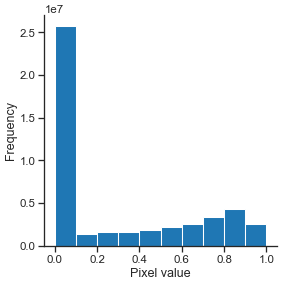

In [2]:
# Normalize pixel values to be between 0 and 1
train_images, test_images = np.expand_dims(train_images / 255.0, -1), np.expand_dims(test_images / 255.0, -1)
fig, ax = plt.subplots(1,1,figsize=(6,6), dpi=50)
ax.hist(train_images.ravel())
ax.set_xlabel('Pixel value')
ax.set_ylabel('Frequency')
despine(ax=ax)

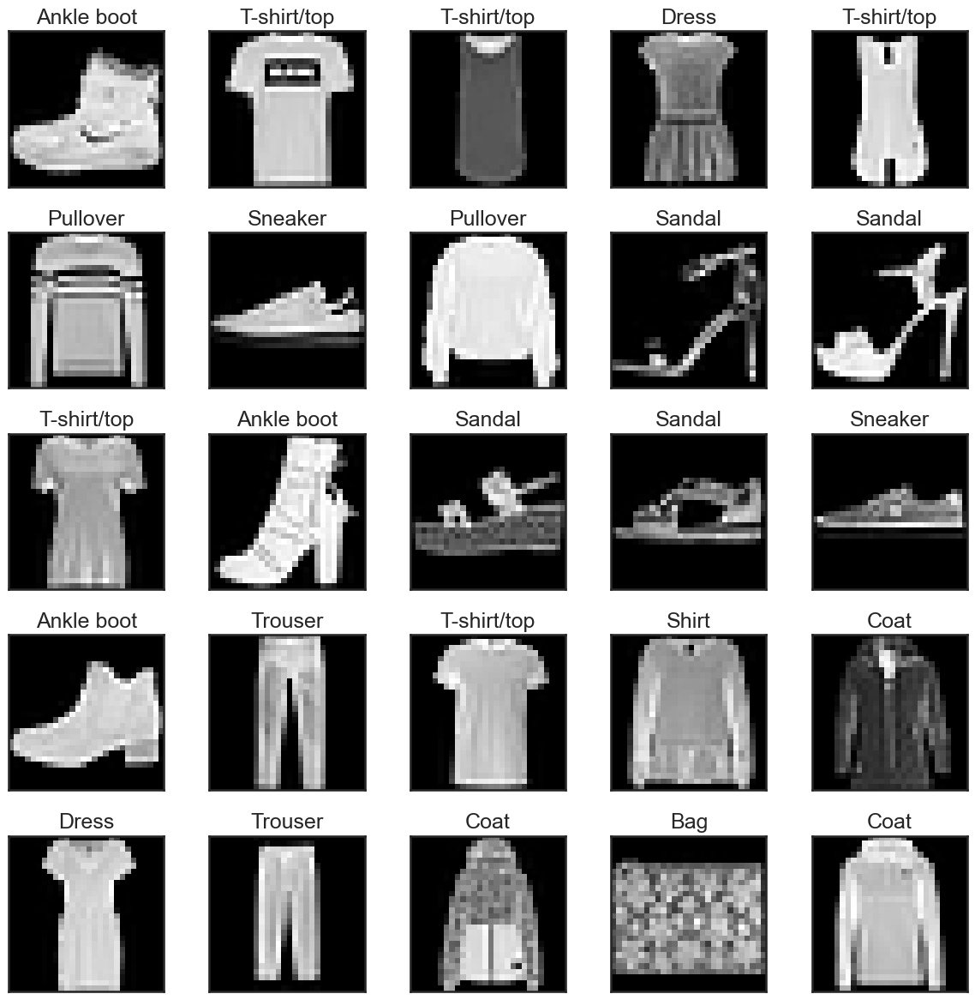

In [3]:
fig, axs = plt.subplots(5,5,figsize=(12,12), dpi=100)
axs = axs.ravel()
for i, ax in enumerate(axs):
    ax.imshow(train_images[i,...,0], cmap='gray')
    ax.set_title(class_names[train_labels[i]])
    ax.set_xticks([])
    ax.set_yticks([])
fig.tight_layout()
fig.savefig(r'C:\Users\mahal\OneDrive\Desktop\Py_programs\Deeplearningbasics\Convolutional_neunet_fig\Fashion-MNIST.png', dpi=600)

2. Convolutional Neural Networks

2.1 Biological inspiration

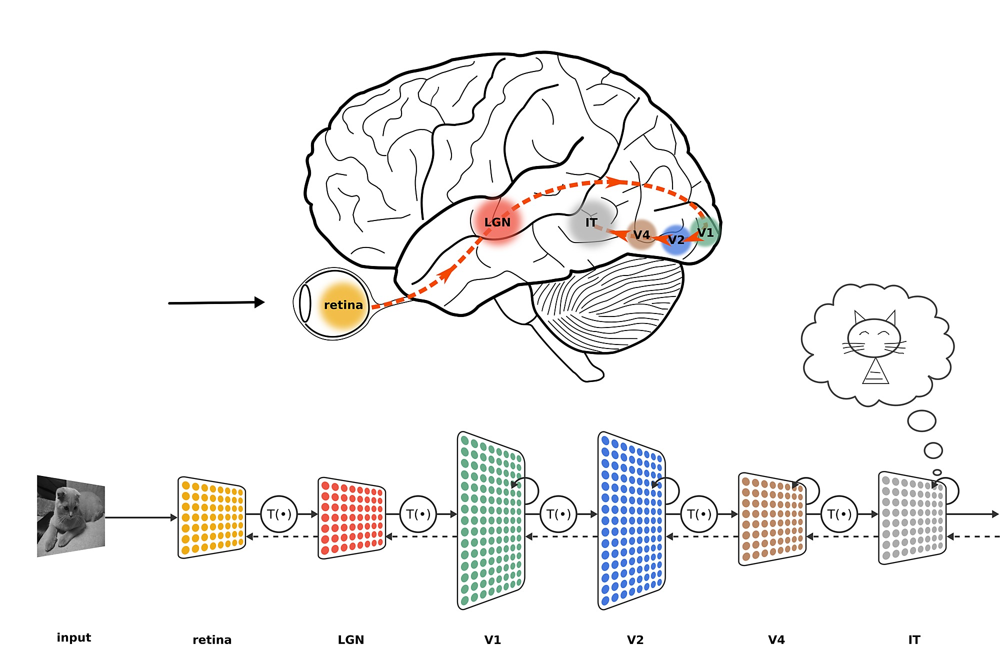

In [4]:
Image(filename=r'C:\Users\mahal\OneDrive\Desktop\Py_programs\Deeplearningbasics\Convolutional_neunet_fig\Human-Vision.jpg')

2.2. Convolution Kernels (or filters)

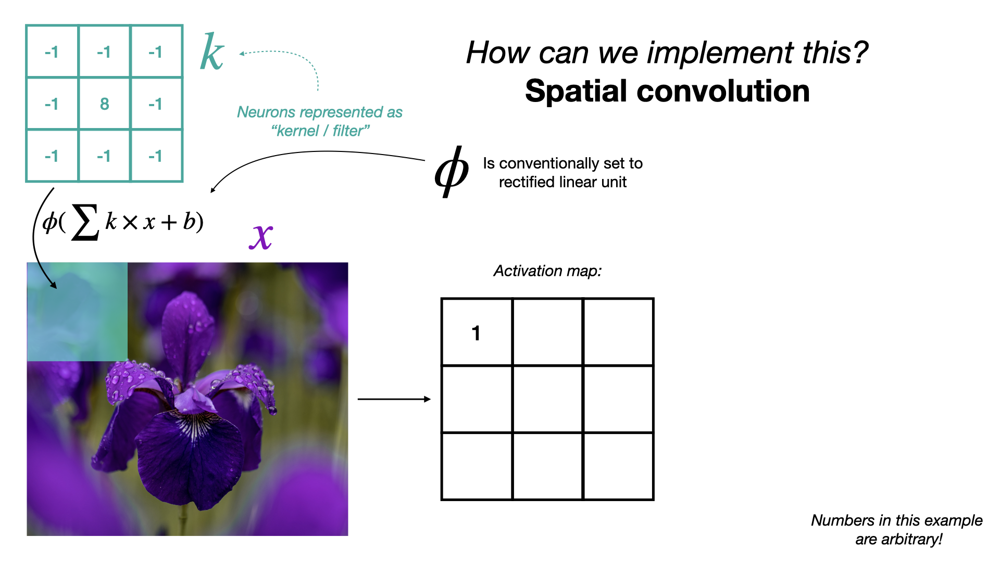

In [5]:
Image(filename=r'C:\Users\mahal\OneDrive\Desktop\Py_programs\Deeplearningbasics\Convolutional_neunet_fig\Spatial-Convolution.png')

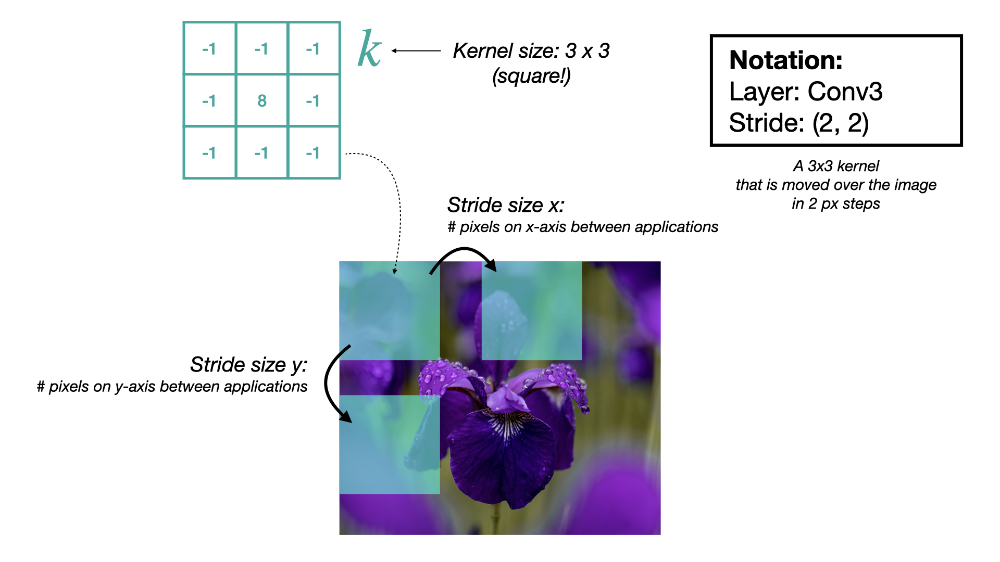

In [6]:
Image(filename=r'C:\Users\mahal\OneDrive\Desktop\Py_programs\Deeplearningbasics\Convolutional_neunet_fig\Stride.png')

In [7]:
def spatial_convolution_2D(image, kernel, bias=0):
    """spatial 2D convolution between an image and 
    a kernel with stride size 1
    """
    m, n = kernel.shape[:2]
    if (m == n):
        yin, xin = image.shape[:2]
        yout = yin - m + 1
        xout = xin - m + 1
        convolved_image = np.zeros((yout,xout))
        for i in range(yout):
            for j in range(xout):
                convolved_image[i,j] = np.sum(image[i:i+m, j:j+m]*kernel) + bias
    return convolved_image


# a kernel that is sensitive to vertical edges:

vertical_edge_kernel = np.zeros((3,3))
vertical_edge_kernel[:,0] = 1
vertical_edge_kernel[:,2] = -1
vertical_edge_kernel[1,0] = 2
vertical_edge_kernel[1,2] = -2
vertical_edge_kernel

array([[ 1.,  0., -1.],
       [ 2.,  0., -2.],
       [ 1.,  0., -1.]])

In [8]:

# a kernel that is sensitive to horizontal edges:

horizontal_edge_kernel = np.zeros((3,3))
horizontal_edge_kernel[0] = 1
horizontal_edge_kernel[2] = -1
horizontal_edge_kernel[0,1] = 2
horizontal_edge_kernel[2,1] = -2
horizontal_edge_kernel

array([[ 1.,  2.,  1.],
       [ 0.,  0.,  0.],
       [-1., -2., -1.]])

In [9]:
# a kernel that is sensitive to all edges:

edge_detection_kernel = -1.0 * np.ones((3,3))
edge_detection_kernel[1,1] = 8
edge_detection_kernel

array([[-1., -1., -1.],
       [-1.,  8., -1.],
       [-1., -1., -1.]])

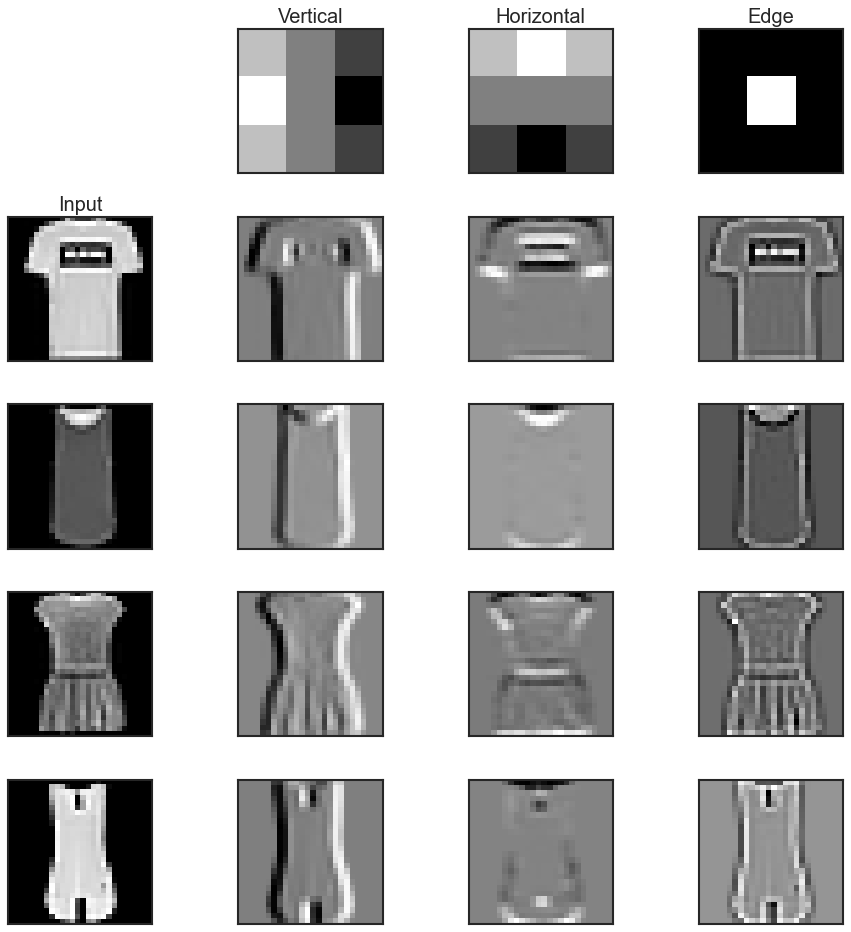

In [12]:
# make figure
fig, axs = plt.subplots(5,4,figsize=(12,12), dpi=80)

# drop axis in upper left corner
axs[0,0].remove()

# plot kernels
axs[0,1].imshow(vertical_edge_kernel, cmap='gray')
axs[0,2].imshow(horizontal_edge_kernel, cmap='gray')
axs[0,3].imshow(edge_detection_kernel, cmap='gray') 

# plot activation maps
for i in range(1,5):
    
    # input image
    axs[i,0].imshow(train_images[i,...,0], cmap='gray')

    # vertical
    convolved_img = spatial_convolution_2D(train_images[i,...,0], vertical_edge_kernel)
    axs[i,1].imshow(convolved_img, cmap='gray')
    
    # horizontal
    convolved_img = spatial_convolution_2D(train_images[i,...,0], horizontal_edge_kernel)
    axs[i,2].imshow(convolved_img, cmap='gray')
    
    # edge
    convolved_img = spatial_convolution_2D(train_images[i,...,0], edge_detection_kernel)
    axs[i,3].imshow(convolved_img, cmap='gray')

# remove ticks
for ax in axs.ravel():
    ax.set_xticks([])
    ax.set_yticks([])

# label axes
axs[1,0].set_title('Input')
axs[0,1].set_title('Vertical')
axs[0,2].set_title('Horizontal')
axs[0,3].set_title('Edge')

# save
fig.tight_layout()
fig.savefig(r'C:\Users\mahal\OneDrive\Desktop\Py_programs\Deeplearningbasics\Convolutional_neunet_fig\Edge-Detection-Kernels.png', dpi=600)



2.3 Stacking many kernels to form a convolutional neural network

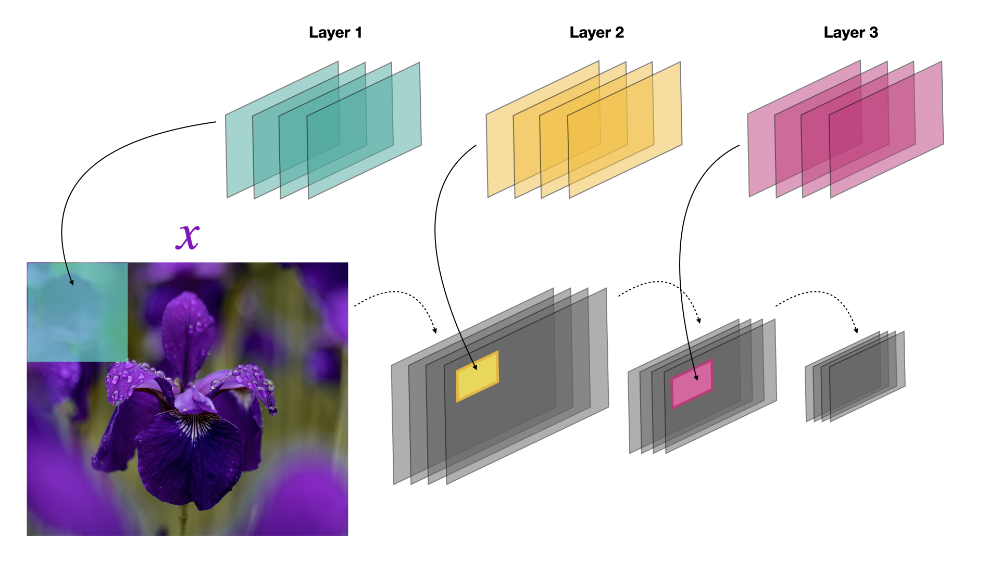

In [13]:
Image(filename=r'C:\Users\mahal\OneDrive\Desktop\Py_programs\Deeplearningbasics\Convolutional_neunet_fig\Convolutional-Neural-Network.png')

2.4 Pooling kernels

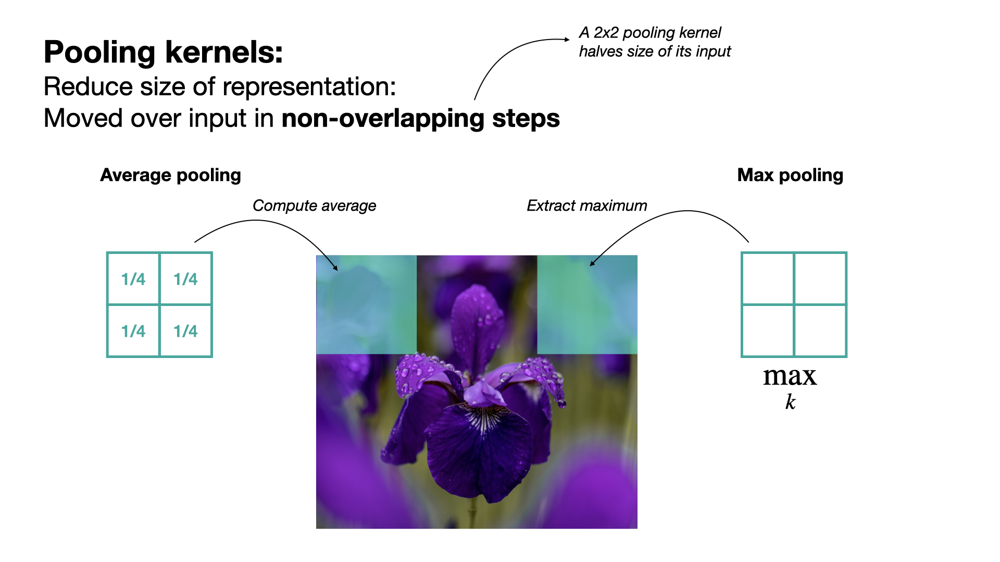

In [14]:
Image(filename=r'C:\Users\mahal\OneDrive\Desktop\Py_programs\Deeplearningbasics\Convolutional_neunet_fig\Pooling-Kernels.png')


2.5 Building a convolutional neural network with Keras and Tensorflow

In [15]:
import tensorflow as tf
from tensorflow.keras import layers, models, losses, Model
# initialize a sequential model
model = models.Sequential()

# add our first convolution layer
model.add(layers.Conv2D(filters=6, # this layer contains 6 kernels
                        kernel_size=(5, 5), # each being 5 x 5 values large
                        activation='tanh', # and activated through a ReLu activation function
                        input_shape=(28, 28, 1))) # this is the shape of the input

# now lets add a 2x2 average pooling layer:
model.add(layers.AveragePooling2D(pool_size=(2,2)))   

# and then another convolution layer:
model.add(layers.Conv2D(filters=16, # this time containing 16 kernels
                        kernel_size=(5, 5), # each again with a size of 5x5 values
                        activation='tanh'))

# another 2x2 average pooling layer:
model.add(layers.AveragePooling2D(pool_size=(2,2))) 

# and add dense output layers
model.add(layers.Flatten()) # flatten the activation maps of the last convolution layer
model.add(layers.Dense(120, activation='tanh'))
model.add(layers.Dense(84, activation='tanh'))
model.add(layers.Dense(10, activation='softmax')) # one neuron for each of the 10 classes in our dataset

model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 24, 24, 6)         156       
                                                                 
 average_pooling2d (Average  (None, 12, 12, 6)         0         
 Pooling2D)                                                      
                                                                 
 conv2d_1 (Conv2D)           (None, 8, 8, 16)          2416      
                                                                 
 average_pooling2d_1 (Avera  (None, 4, 4, 16)          0         
 gePooling2D)                                                    
                                                                 
 flatten (Flatten)           (None, 256)               0         
                                                                 
 dense (Dense)               (None, 120)               

2.6 Training the model

In [17]:
np.random.seed(1312)
tf.random.set_seed(1312)
model.compile(optimizer='rmsprop',
              loss=losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy']) # tell Keras to also track the predictive accuracy of our model during training


np.random.seed(1312)
tf.random.set_seed(1312)
history = model.fit(x=train_images,
                    y=train_labels,
                    epochs=10, 
                    batch_size=32,
                    validation_data=(test_images, test_labels))

Epoch 1/10



c:\Users\mahal\anaconda3\Lib\site-packages\keras\src\backend.py:5727: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(



1875/1875 [==============================] - 9s 4ms/step - loss: 0.5462 - accuracy: 0.7968 - val_loss: 0.4386 - val_accuracy: 0.8388
Epoch 2/10
1875/1875 [==============================] - 8s 4ms/step - loss: 0.3936 - accuracy: 0.8549 - val_loss: 0.3908 - val_accuracy: 0.8546
Epoch 3/10
1875/1875 [==============================] - 8s 4ms/step - loss: 0.3493 - accuracy: 0.8709 - val_loss: 0.3911 - val_accuracy: 0.8552
Epoch 4/10
1875/1875 [==============================] - 8s 4ms/step - loss: 0.3220 - accuracy: 0.8819 - val_loss: 0.3752 - val_accuracy: 0.8646
Epoch 5/10
1875/1875 [==============================] - 9s 5ms/step - loss: 0.3025 - accuracy: 0.8888 - val_loss: 0.3444 - val_accuracy: 0.8727
Epoch 6/10
1875/1875 [==============================] - 8s 4ms/step - loss: 0.2847 - accuracy: 0.8952 - val_loss: 0.3478 - val_accuracy: 0.8792
Epoch 7/10
1875/1875 [==============================] - 10s 5ms/step - loss: 0.2723 - accuracy: 0.9005 - val_loss: 0.3242 - val_accuracy: 0.8834
E

313/313 [==============================] - 1s 2ms/step


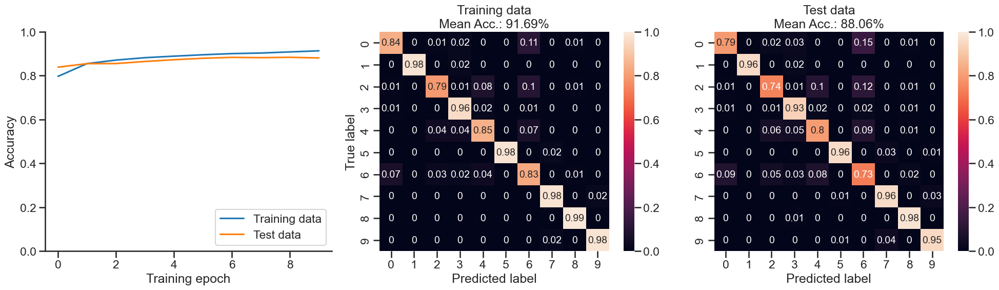

In [19]:
# setup figure
fig, axs = plt.subplots(1,3,figsize=(20,6))

# plot training loss
axs[0].plot(history.history['accuracy'], label='Training data')
axs[0].plot(history.history['val_accuracy'], label = 'Test data')
axs[0].set_xlabel('Training epoch')
axs[0].set_ylabel('Accuracy')
axs[0].set_ylim([0, 1])
axs[0].legend(loc='lower right')
despine(ax=axs[0])

# plot confusion matrix for training and test datasets
for i, (label, X, y) in enumerate(zip(['Training', 'Test'],
                                      [train_images, test_images],
                                      [train_labels, test_labels])):
    y_pred = model.predict(X).argmax(axis=1)
    acc = np.mean(y_pred == y)
    axs[1+i].set_title('{} data\nMean Acc.: {}%'.format(label, np.round(acc*100, 2)))
    conf_mat = confusion_matrix(y, y_pred, normalize='true')
    sns.heatmap(np.round(conf_mat, 2), annot=True,
                ax=axs[1+i], vmin=0, vmax=1,
                annot_kws={'fontsize': 14})
    if i == 0:
        axs[1+i].set_ylabel('True label')
    axs[1+i].set_xlabel('Predicted label')

# save figure
fig.tight_layout()
fig.savefig(r'C:\Users\mahal\OneDrive\Desktop\Py_programs\Deeplearningbasics\Convolutional_neunet_fig\Training-Stats.png', dpi=600)

3. Your exercise:

Epoch 1/10


c:\Users\mahal\anaconda3\Lib\site-packages\keras\src\backend.py:5727: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


1875/1875 [==============================] - 9s 5ms/step - loss: 0.5535 - accuracy: 0.7952 - val_loss: 0.4395 - val_accuracy: 0.8429
Epoch 2/10
1875/1875 [==============================] - 12s 7ms/step - loss: 0.3963 - accuracy: 0.8556 - val_loss: 0.3961 - val_accuracy: 0.8568
Epoch 3/10
1875/1875 [==============================] - 7s 4ms/step - loss: 0.3532 - accuracy: 0.8717 - val_loss: 0.3727 - val_accuracy: 0.8647
Epoch 4/10
1875/1875 [==============================] - 7s 4ms/step - loss: 0.3242 - accuracy: 0.8820 - val_loss: 0.3611 - val_accuracy: 0.8689
Epoch 5/10
1875/1875 [==============================] - 7s 4ms/step - loss: 0.3042 - accuracy: 0.8892 - val_loss: 0.3360 - val_accuracy: 0.8789
Epoch 6/10
1875/1875 [==============================] - 9s 5ms/step - loss: 0.2862 - accuracy: 0.8949 - val_loss: 0.3380 - val_accuracy: 0.8811
Epoch 7/10
1875/1875 [==============================] - 8s 4ms/step - loss: 0.2713 - accuracy: 0.9012 - val_loss: 0.3242 - val_accuracy: 0.8856
Ep

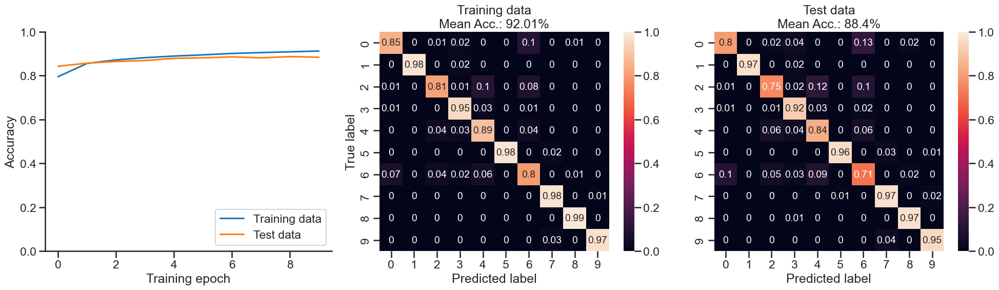

In [20]:
# 1. Model Specification:
# ----------------
# initialize a sequential model
model = models.Sequential()

# add our first convolution layer
model.add(layers.Conv2D(filters=6, # this layer contains 6 kernels
                        kernel_size=(5, 5), # each being 5 x 5 values large
                        activation='tanh', # and activated through a ReLu activation function
                        input_shape=(28, 28, 1))) # this is the shape of the input

# now lets add a 2x2 average pooling layer:
model.add(layers.AveragePooling2D(pool_size=(2,2)))   

# and then another convolution layer:
model.add(layers.Conv2D(filters=16, # this time containing 16 kernels
                        kernel_size=(5, 5), # each again with a size of 5x5 values
                        activation='tanh'))

# another 2x2 average pooling layer:
model.add(layers.AveragePooling2D(pool_size=(2,2))) 

# and add dense output layers
model.add(layers.Flatten()) # flatten the activation maps of the last convolution layer
model.add(layers.Dense(120, activation='tanh'))
model.add(layers.Dense(84, activation='tanh'))
model.add(layers.Dense(10, activation='softmax')) # one neuron for each of the 10 classes in our dataset
# ----------------





# 2. Compiling the model:
# ----------------
np.random.seed(1312)
tf.random.set_seed(1312)
model.compile(optimizer='rmsprop',
              loss=losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy']) 
# ----------------





# 3. Training:
# ----------------
np.random.seed(1312)
tf.random.set_seed(1312)
history = model.fit(x=train_images,
                    y=train_labels,
                    epochs=10, 
                    batch_size=32,
                    validation_data=(test_images, test_labels))
# ----------------





# 4. Plot the results
# ----------------
# setup the figure
fig, axs = plt.subplots(1,3,figsize=(20,6))

# plot training loss
axs[0].plot(history.history['accuracy'], label='Training data')
axs[0].plot(history.history['val_accuracy'], label = 'Test data')
axs[0].set_xlabel('Training epoch')
axs[0].set_ylabel('Accuracy')
axs[0].set_ylim([0, 1])
axs[0].legend(loc='lower right')
despine(ax=axs[0])

# plot confusion matrix for training and test datasets
for i, (label, X, y) in enumerate(zip(['Training', 'Test'],
                                      [train_images, test_images],
                                      [train_labels, test_labels])):
    y_pred = model.predict(X).argmax(axis=1)
    acc = np.mean(y_pred == y)
    axs[1+i].set_title('{} data\nMean Acc.: {}%'.format(label, np.round(acc*100, 2)))
    conf_mat = confusion_matrix(y, y_pred, normalize='true')
    sns.heatmap(np.round(conf_mat, 2), annot=True,
                ax=axs[1+i], vmin=0, vmax=1,
                annot_kws={'fontsize': 14})
    if i == 0:
        axs[1+i].set_ylabel('True label')
    axs[1+i].set_xlabel('Predicted label')

# save figure
fig.tight_layout()
# ----------------


4. One last bonus: activation maximization with deep dream

In [25]:
vgg16 = tf.keras.applications.VGG16(include_top=False, weights='imagenet')
vgg16.summary()

58889256/58889256 [==============================] - 36s 1us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                             

In [28]:
run_analysis = False


In [29]:
if run_analysis:
    # load deep dream
    from helpers.deep_dream import run_deep_dream
   
    # set random seed
    np.random.seed(2135)
    tf.random.set_seed(2135)

    # setup figure
    fig, axs = plt.subplots(3,4,figsize=(20,15), dpi=200)

    # define random input image
    random_input = np.random.uniform(0,255,(200,200,3)).astype(np.int)

    # iterate three layers from VGG16
    for i, layer_name in enumerate(['block1_conv1', 'block2_conv2', 'block3_conv3', 'block4_conv3']):

        # Create the feature extraction model
        layer_output = vgg16.get_layer(layer_name).output
        for j, k in enumerate([0,10,35]):
            print('Processing layer: {}, kernel: {}'.format(layer_name, k))
            dream_model = tf.keras.Model(inputs=vgg16.input,
                                         outputs=layer_output[...,k])

            # run deep dream
            img = run_deep_dream(dream_model, random_input,
                                 show_progress=False)

            # plot
            axs[j,i].imshow(img.numpy())
            axs[j,i].set_title('Layer: {} (Kernel: {})'.format(layer_name, k))
            axs[j,i].set_xticks([])
            axs[j,i].set_yticks([])
            despine(ax=axs[j,i])

    # save
    fig.tight_layout()
    fig.savefig(r'C:\Users\mahal\OneDrive\Desktop\Py_programs\Deeplearningbasics\Convolutional_neunet_fig\VGG16-Deep-Dream-Kernels.png', dpi=600)

In [30]:
Image(filename=r'C:\Users\mahal\OneDrive\Desktop\Py_programs\Deeplearningbasics\Convolutional_neunet_fig\VGG16-Deep-Dream-Kernels.png')

In [31]:
run_analysis = False

In [33]:
if run_analysis:
    # import deep dream
    from helpers.deep_dream import run_deep_dream
    
    # set random seed
    np.random.seed(2135)
    tf.random.set_seed(2135)

    # setup figure
    fig, axs = plt.subplots(1,4,figsize=(20,6), dpi=200)

    # define random input image
    random_input = np.random.uniform(0,255,(200,200,3)).astype(np.int)

    # iterate three layers from VGG16
    for i, layer_name in enumerate(['block1_conv1', 'block2_conv2', 'block3_conv3', 'block4_conv3']):

        # Create the feature extraction model
        layer_output = vgg16.get_layer(layer_name).output
        dream_model = tf.keras.Model(inputs=vgg16.input,
                                     outputs=layer_output)

        # run deep dream
        img = run_deep_dream(dream_model, random_input,
                             show_progress=False)

        # plot
        axs[i].imshow(img.numpy())
        axs[i].set_title('Layer: {}'.format(layer_name, k))
        axs[i].set_xticks([])
        axs[i].set_yticks([])
        despine(ax=axs[i])

    # save
    fig.tight_layout()
    fig.savefig(r'C:\Users\mahal\OneDrive\Desktop\Py_programs\Deeplearningbasics\Convolutional_neunet_fig\VGG16-Deep-Dream-Layers.png', dpi=600)


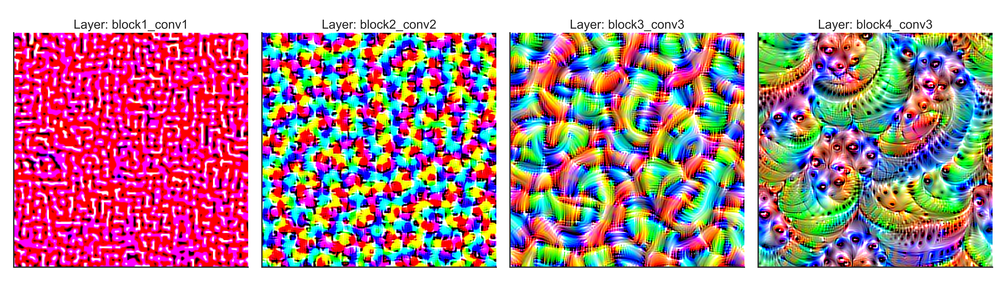

In [32]:
Image(filename=r'C:\Users\mahal\OneDrive\Desktop\Py_programs\Deeplearningbasics\Convolutional_neunet_fig\VGG16-Deep-Dream-Layers.png')